In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns # for making plots with seaborn
color = sns.color_palette()

In [2]:
country_stats = pd.read_csv('country_stats.csv')
hh_size = pd.read_csv('household_size.csv')
#indicate = pd.read_csv('indicators.csv')
DHS = pd.read_csv('KIVA.DHSv4.csv')
loan_coord = pd.read_csv('loan_coords.csv')
loans_lenders = pd.read_csv('loans_lenders.csv')
kiva_loans = pd.read_csv('kiva_loans.csv')
MPI = pd.read_csv('MPI_subnational.csv')


In [3]:
kiva_loans.head()

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,partner_id,posted_time,disbursed_time,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date
0,653051,300.0,300.0,Fruits & Vegetables,Food,"To buy seasonal, fresh fruits to sell.",PK,Pakistan,Lahore,PKR,247.0,2014-01-01 06:12:39+00:00,2013-12-17 08:00:00+00:00,2014-01-02 10:06:32+00:00,12.0,12,NaN,female,irregular,2014-01-01
1,653053,575.0,575.0,Rickshaw,Transportation,to repair and maintain the auto rickshaw used ...,PK,Pakistan,Lahore,PKR,247.0,2014-01-01 06:51:08+00:00,2013-12-17 08:00:00+00:00,2014-01-02 09:17:23+00:00,11.0,14,NaN,"female, female",irregular,2014-01-01
2,653068,150.0,150.0,Transportation,Transportation,To repair their old cycle-van and buy another ...,IN,India,Maynaguri,INR,334.0,2014-01-01 09:58:07+00:00,2013-12-17 08:00:00+00:00,2014-01-01 16:01:36+00:00,43.0,6,"user_favorite, user_favorite",female,bullet,2014-01-01
3,653063,200.0,200.0,Embroidery,Arts,to purchase an embroidery machine and a variet...,PK,Pakistan,Lahore,PKR,247.0,2014-01-01 08:03:11+00:00,2013-12-24 08:00:00+00:00,2014-01-01 13:00:00+00:00,11.0,8,NaN,female,irregular,2014-01-01
4,653084,400.0,400.0,Milk Sales,Food,to purchase one buffalo.,PK,Pakistan,Abdul Hakeem,PKR,245.0,2014-01-01 11:53:19+00:00,2013-12-17 08:00:00+00:00,2014-01-01 19:18:51+00:00,14.0,16,NaN,female,monthly,2014-01-01


In [33]:
kiva_loans.tail()

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,partner_id,posted_time,disbursed_time,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date
671200,1340323,0.0,25.0,Livestock,Agriculture,"[True, u'para compara: cemento, arenya y ladri...",PY,Paraguay,Concepción,USD,58.0,2017-07-25 16:55:34+00:00,2017-07-25 07:00:00+00:00,NaN,13.0,0,NaN,female,monthly,2017-07-25
671201,1340316,25.0,25.0,Livestock,Agriculture,"[True, u'to start a turducken farm.'] - this l...",KE,Kenya,NaN,KES,138.0,2017-07-25 06:14:08+00:00,2017-07-24 07:00:00+00:00,2017-07-26 02:09:43+00:00,13.0,1,NaN,female,monthly,2017-07-25
671202,1340334,0.0,25.0,Games,Entertainment,NaN,KE,Kenya,NaN,KES,138.0,2017-07-26 00:02:07+00:00,2017-07-25 07:00:00+00:00,NaN,13.0,0,NaN,NaN,monthly,2017-07-26
671203,1340338,0.0,25.0,Livestock,Agriculture,"[True, u'to start a turducken farm.'] - this l...",KE,Kenya,NaN,KES,138.0,2017-07-26 06:12:55+00:00,2017-07-25 07:00:00+00:00,NaN,13.0,0,NaN,female,monthly,2017-07-26
671204,1340339,0.0,25.0,Livestock,Agriculture,"[True, u'to start a turducken farm.'] - this l...",KE,Kenya,NaN,KES,138.0,2017-07-26 06:31:46+00:00,2017-07-25 07:00:00+00:00,NaN,13.0,0,NaN,female,monthly,2017-07-26


In [32]:
kiva_loans.shape

(671205, 20)

In [31]:
kiva_loans['borrower_genders'].value_counts()

female                                                                                                                                                                                                      426502
male                                                                                                                                                                                                        134710
female, female                                                                                                                                                                                               12164
female, female, female                                                                                                                                                                                       11676
female, female, female, female                                                                                                                              

In [4]:
null_values = kiva_loans.isnull().sum().sort_values(ascending = False)
print(null_values)

tags                  171416
region                 56800
funded_time            48331
partner_id             13507
use                     4232
borrower_genders        4221
disbursed_time          2396
country_code               8
date                       0
funded_amount              0
loan_amount                0
activity                   0
sector                     0
currency                   0
country                    0
repayment_interval         0
posted_time                0
term_in_months             0
lender_count               0
id                         0
dtype: int64


In [5]:
activity_groups = kiva_loans.groupby('activity')
activity_groups['loan_amount'].mean().sort_values(ascending = False)

activity
Technology                   4520.365169
Landscaping / Gardening      4339.705882
Communications               3695.833333
Cleaning Services            3375.172414
Renewable Energy Products    3093.803419
Child Care                   2717.896175
Florist                      2283.846154
Entertainment                2277.031603
Film                         2092.307692
Used Shoes                   1899.102394
Goods Distribution           1886.552347
Perfumes                     1758.231707
Adult Care                   1687.500000
Tourism                      1599.866310
Health                       1582.692308
Restaurant                   1495.653483
Bookstore                    1480.995475
Beekeeping                   1472.500000
Clothing                     1470.961308
Cement                       1469.407895
Event Planning               1435.000000
Textiles                     1409.164223
Services                     1398.924238
Natural Medicines            1345.761671
Educati

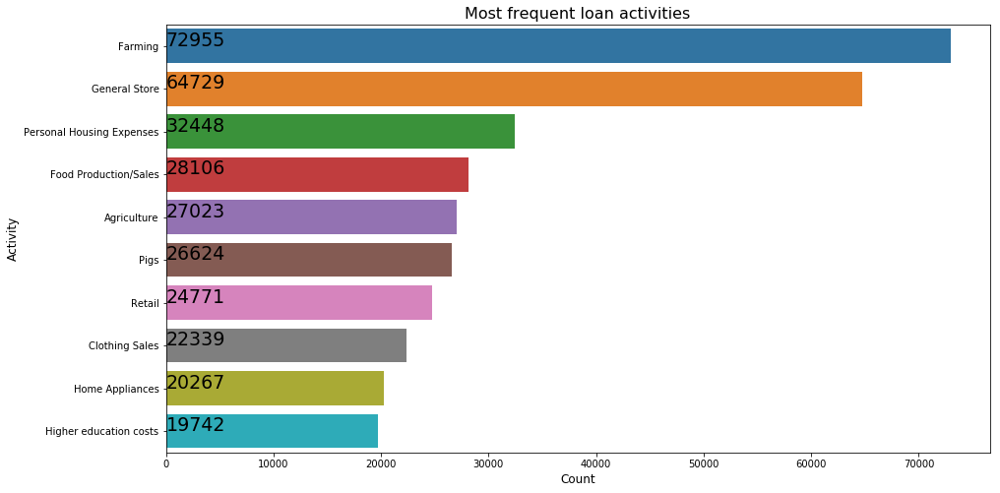

In [17]:

def plot1():

    plt.figure(figsize=(15,8))
    count = kiva_loans['activity'].value_counts().head(10)
    sns.barplot(count.values, count.index, )
    for i, v in enumerate(count.values):
        plt.text(0.8,i,v,color='k',fontsize=19)
        plt.xlabel('Count', fontsize=12)
        plt.ylabel('Activity', fontsize=12)
        plt.title("Most frequent loan activities", fontsize=16)
        
plot1()        

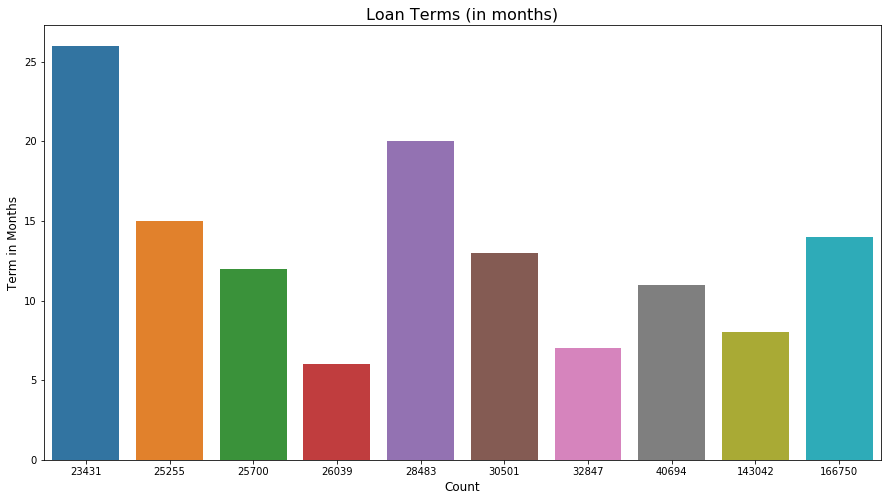

In [7]:

def plot2():

    plt.figure(figsize=(15,8))
    count = kiva_loans['term_in_months'].value_counts().sort_values(ascending = False).head(10)
    sns.barplot(count.values, count.index, )
    for i, v in enumerate(count.values):
        #plt.text(0.8,i,v,color='k',fontsize=19)
        plt.xlabel('Count', fontsize=12)
        plt.ylabel('Term in Months', fontsize=12)
        plt.title("Loan Terms (in months)", fontsize=16)
        
plot2()    

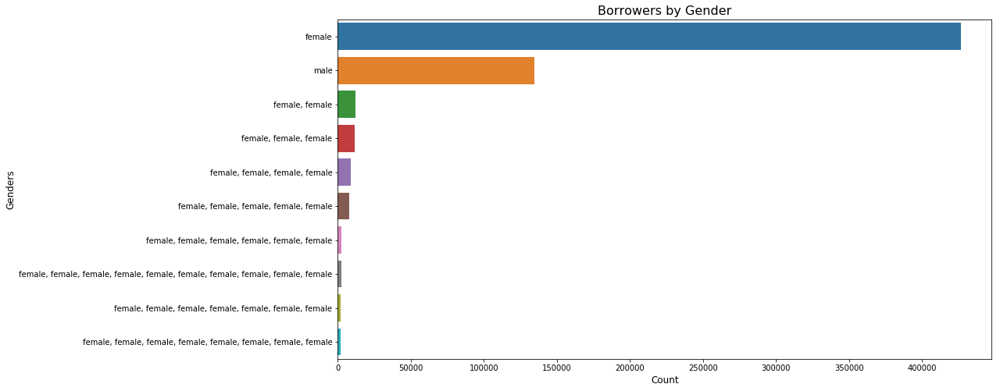

In [8]:
def plot3():

    plt.figure(figsize=(15,8))
    count = kiva_loans['borrower_genders'].value_counts().sort_values(ascending = False).head(10)
    sns.barplot(count.values, count.index, )
    for i, v in enumerate(count.values):
        #plt.text(0.8,i,v,color='k',fontsize=19)
        plt.xlabel('Count', fontsize=12)
        plt.ylabel('Genders', fontsize=12)
        plt.title("Borrowers by Gender", fontsize=16)
        
plot3()    

In [9]:
kiva_loans['use'].head(20)

0               To buy seasonal, fresh fruits to sell. 
1     to repair and maintain the auto rickshaw used ...
2     To repair their old cycle-van and buy another ...
3     to purchase an embroidery machine and a variet...
4                              to purchase one buffalo.
5     purchase leather for my business using ksh 20000.
6     To purchase a dairy cow and start a milk produ...
7            to buy more hair and skin care products.  
8     to purchase leather, plastic soles and heels i...
9     to buy a stall, gram flour, ketchup, and coal ...
10              to cover the cost of repairing rickshaw
11     to purchase biscuits, sweets and juices in bulk.
12              to buy stock of rice, sugar and flour .
13       to purchase variety of winter clothes to sell.
14       to expand her existing  poultry farm business.
15                    to buy a three-wheeled rickshaw. 
16       to buy packs of salts, biscuits and beverages.
17    To buy a sewing machine, lace, zippers and

In [25]:
kiva_loans['borrower_genders'][kiva_loans['repayment_interval'] == 'monthly'].value_counts()


female                                                                                                                                                                  193709
male                                                                                                                                                                     87609
female, female                                                                                                                                                            9378
female, female, female                                                                                                                                                    8796
female, female, female, female                                                                                                                                            7376
female, female, female, female, female                                                                                       

In [26]:
kiva_loans['borrower_genders'].value_counts()

female                                                                                                                                                                                                      426502
male                                                                                                                                                                                                        134710
female, female                                                                                                                                                                                               12164
female, female, female                                                                                                                                                                                       11676
female, female, female, female                                                                                                                              

In [28]:
repay_activity = ['activity', 'repayment_interval']
cm = sns.light_palette('green', as_cmap=True)
pd.crosstab(kiva_loans[repay_activity[0]], kiva_loans[repay_activity[1]]).style.background_gradient(cmap = cm)

repayment_interval,bullet,irregular,monthly,weekly
activity,,,,
Adult Care,0,0,2,0
Agriculture,10242,4796,11946,39
Air Conditioning,0,9,27,0
Animal Sales,1004,1392,6841,0
Aquaculture,18,40,50,0
Arts,80,563,449,0
Auto Repair,67,251,1018,0
Bakery,160,1331,2129,0
Balut-Making,1,47,13,0


In [30]:
borrow_gender = ['borrower_genders', 'repayment_interval']
cm = sns.light_palette('yellow', as_cmap=True)
pd.crosstab(kiva_loans[borrow_gender[0]], kiva_loans[borrow_gender[1]]).style.background_gradient(cmap = cm)

In [29]:
sector_repayment = ['sector', 'repayment_interval']
cm = sns.light_palette('blue', as_cmap=True)
pd.crosstab(kiva_loans[sector_repayment[0]], kiva_loans[sector_repayment[1]]).style.background_gradient(cmap = cm)

repayment_interval,bullet,irregular,monthly,weekly
sector,,,,
Agriculture,43963,47524,88776,39
Arts,1475,4636,5934,15
Clothing,1048,13559,17997,138
Construction,294,1549,4414,11
Education,2437,4351,24225,0
Entertainment,155,226,449,0
Food,4607,75914,56039,97
Health,138,1659,7413,13
Housing,880,8451,24400,0


In [10]:
#################. COUNTRY STATS

In [11]:
country_stats.head()

,country_name,country_code,country_code3,continent,region,population,population_below_poverty_line,hdi,life_expectancy,expected_years_of_schooling,mean_years_of_schooling,gni,kiva_country_name
0,India,IN,IND,Asia,Southern Asia,1339180127,21.9,0.623559,68.322,11.696590,6.298834,5663.474799,India
1,Nigeria,NG,NGA,Africa,Western Africa,190886311,70.0,0.527105,53.057,9.970482,6.000000,5442.901264,Nigeria
2,Mexico,MX,MEX,Americas,Central America,129163276,46.2,0.761683,76.972,13.299090,8.554985,16383.106680,Mexico
3,Pakistan,PK,PAK,Asia,Southern Asia,197015955,29.5,0.550354,66.365,8.106910,5.089460,5031.173074,Pakistan
4,Bangladesh,BD,BGD,Asia,Southern Asia,164669751,31.5,0.578824,71.985,10.178706,5.241577,3341.490722,Bangladesh


In [12]:
a = country_stats.groupby(['kiva_country_name', 'population_below_poverty_line'])
print(a)

In [13]:
######################### hh size

In [14]:
hh_size.head()

,country;male_headship;average_household_size;avg_children_nb
0,Philippines;0.81;4.7;2.3
1,Kenya;0.68;3.9;2.6
2,El Salvador;0.65;4.1;2.1
3,Cambodia;0.73;4.6;2.0
4,Pakistan;0.89;6.8;3.2


In [15]:
###################### DHS

In [16]:
DHS.head()

,Unnamed: 0,DHSCLUST,Partner.ID,Field.Partner.Name,sector,Loan.Theme.ID,Loan.Theme.Type,country,forkiva,region,...,Nb.Electricity,Nb.fuel,Nb.floor,Nb.imp.sanitation,Nb.imp.water,Nb.child.mort,Median.educ,Nb.television,Nb.phone,MPI.pctn
0,1,366,154,FundaciÍ_n Mario Santo Domingo (FMSD),Other,a1050000002ZOr8,Control Group - Research Study,Colombia,No,Barranquilla,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,7.0,1.0,0.0
1,2,366,154,FundaciÍ_n Mario Santo Domingo (FMSD),Other,a1050000006Tm5J,Single mothers,Colombia,No,Barranquilla,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,7.0,1.0,0.0
2,3,366,154,FundaciÍ_n Mario Santo Domingo (FMSD),Other,a1050000000wf0w,General,Colombia,No,Barranquilla,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,7.0,1.0,0.0
3,4,366,154,FundaciÍ_n Mario Santo Domingo (FMSD),Other,a1050000002ZOqt,Flexible loan conditions,Colombia,Yes,Barranquilla,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,7.0,1.0,0.0
4,5,366,154,FundaciÍ_n Mario Santo Domingo (FMSD),Other,a1050000006Tm4k,Unbanked,Colombia,No,Barranquilla,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,7.0,1.0,0.0


In [17]:
####### loan coordinates

In [18]:
loan_coord.head()

,loan_id,latitude,longitude
0,657307,8.162411,123.77412
1,673156,8.162411,123.77412
2,888943,8.162411,123.77412
3,613323,8.162411,123.77412
4,777937,8.162411,123.77412


In [19]:
############ loans_lenders

In [20]:
loans_lenders.head()

,loan_id,lenders
0,483693,"muc888, sam4326, camaran3922, lachheb1865, reb..."
1,483738,"muc888, nora3555, williammanashi, barbara5610,..."
2,485000,"muc888, terrystl, richardandsusan8352, sherri4..."
3,486087,"muc888, james5068, rudi5955, daniel9859, don92..."
4,534428,"muc888, niki3008, teresa9174, mike4896, david7..."


In [21]:
############# MPI

In [22]:
MPI.head()

,ISO country code,Country,Sub-national region,World region,MPI National,MPI Regional,Headcount Ratio Regional,Intensity of deprivation Regional
0,AFG,Afghanistan,Badakhshan,South Asia,0.295,0.387,67.5,57.3
1,AFG,Afghanistan,Badghis,South Asia,0.295,0.466,79.3,58.8
2,AFG,Afghanistan,Baghlan,South Asia,0.295,0.300,59.7,50.3
3,AFG,Afghanistan,Balkh,South Asia,0.295,0.301,55.7,54.1
4,AFG,Afghanistan,Bamyan,South Asia,0.295,0.325,61.0,53.3


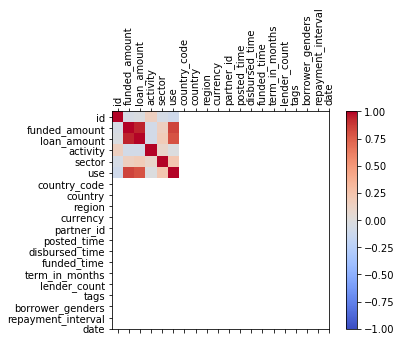

In [9]:
corr = kiva_loans.corr()
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(kiva_loans.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(kiva_loans.columns)
ax.set_yticklabels(kiva_loans.columns)
plt.show()